In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import sys
sys.path.append("../")

In [36]:
import argparse
import torch
from torchtext.vocab import build_vocab_from_iterator
from src.data import *
from src.models import *
from src.lit_models import *
import os
import os.path as osp
import json
import numpy as np
from collections import Counter

In [4]:
from src.data.sard import SARDataset

In [5]:
RAW_DIR = "../data/SARD/raw/llvmir/"
args = argparse.Namespace(raw_dir=RAW_DIR)

In [6]:
dataset = SARDataset(RAW_DIR, 1000)

In [7]:
tokenized_data = []
tokenized_labels = []
raw_dir = RAW_DIR
counter = Counter()
mapping, reverse_mapping = SARDataset.get_mappings(raw_dir)
for cwe_folder in os.listdir(raw_dir):
    CWE_NAME = cwe_folder.split("_")[0]
    for file in os.listdir(osp.join(raw_dir, cwe_folder)):
        with open(osp.join(raw_dir, cwe_folder, file)) as f:
            f_ = json.load(f)
            tokenized_data.append(f_)
            tokenized_labels.append(CWE_NAME)
            counter.update(f_)
vocab = build_vocab_from_iterator(tokenized_data, min_freq=1000, special_first=False)
vocab.set_default_index(len(vocab))
data = tokenized_data
labels = tokenized_labels

In [8]:
len(tokenized_data), len(tokenized_labels)

(18002, 18002)

In [9]:
import matplotlib.pyplot as plt

In [10]:
counter.most_common(100)

[('int64_t', 2956825),
 ('{', 1510072),
 ('}', 1505816),
 ('return', 1073229),
 ('=', 1022227),
 ('result;', 906507),
 ('*', 652056),
 ('int32_t', 475840),
 ('if', 308511),
 ('0;', 291736),
 ('!=', 264419),
 ('result', 237538),
 ('void', 235962),
 ('a1);', 229778),
 ('+', 224052),
 ('a1)', 210038),
 ('0)', 188717),
 ('a1,', 154006),
 ('v2', 153482),
 ('v1', 132030),
 ('a2,', 127073),
 ('#include', 118867),
 ('format,', 112972),
 ('char', 104812),
 ('v2;', 102458),
 ('(v1', 99001),
 ('"int64_t",', 96377),
 ('__stack_chk_fail();', 90014),
 ('v3;', 88546),
 ('v3', 86108),
 ('a3);', 84293),
 ('==', 76845),
 ('>>', 73567),
 ('__readfsqword(40);', 72679),
 ('__readfsqword(40))', 72659),
 ('v4', 64519),
 ('&', 64249),
 ('**', 57287),
 ('*(char', 57037),
 ('*(int32_t', 56792),
 ('...);', 56698),
 ('...)', 56698),
 ('while', 56208),
 ('s,', 55076),
 ('v1;', 52754),
 ('a3,', 52143),
 ('(void', 52143),
 ('1;', 51957),
 ('-', 51805),
 ('uint64_t', 47131),
 ('(int32_t)a1);', 44713),
 ('"{",', 44431

<BarContainer object of 20 artists>

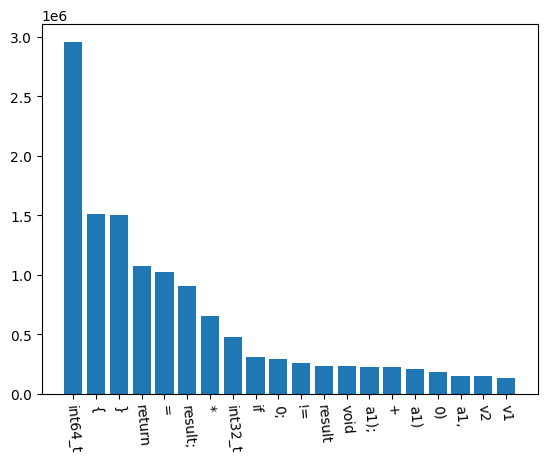

In [11]:
most_common = dict(counter.most_common(20))
plt.xticks(rotation=-85)
plt.bar(most_common.keys(), most_common.values())

In [12]:
most_common

{'int64_t': 2956825,
 '{': 1510072,
 '}': 1505816,
 'return': 1073229,
 '=': 1022227,
 'result;': 906507,
 '*': 652056,
 'int32_t': 475840,
 'if': 308511,
 '0;': 291736,
 '!=': 264419,
 'result': 237538,
 'void': 235962,
 'a1);': 229778,
 '+': 224052,
 'a1)': 210038,
 '0)': 188717,
 'a1,': 154006,
 'v2': 153482,
 'v1': 132030}

### "{" MORE THAN "}"

In [13]:
closing_wing_count = sum([ 0 if "}" not in k else v for k, v in counter.items()]) - counter["}"] 
opening_wing_count = sum([ 0 if "{" not in k else v for k, v in counter.items()]) - counter["{"]
opening_wing_count - closing_wing_count

-4256

In [14]:
opening_wing_count, closing_wing_count

(44500, 48756)

<BarContainer object of 20 artists>

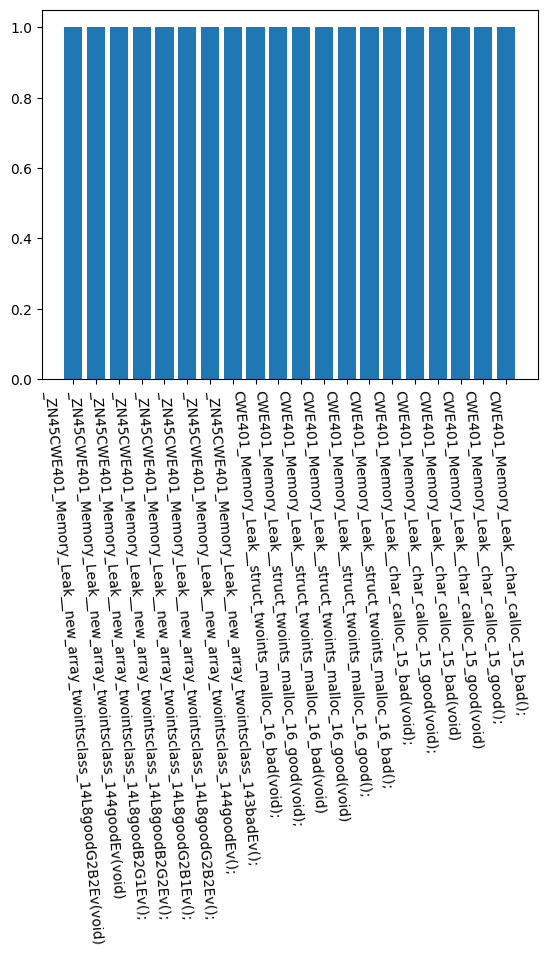

In [15]:
least_common = dict(counter.most_common()[-20:])
plt.xticks(rotation=-85)
plt.bar(least_common.keys(), least_common.values())

In [16]:
import pandas as pd

In [17]:
cdf = pd.Series(dict(counter.most_common()))
cdf[cdf == 1]

_ZN71CWE457_Use_of_Uninitialized_Variable__twointsclass_array_new_no_init_133badEv(void);          1
_ZN71CWE457_Use_of_Uninitialized_Variable__twointsclass_array_new_no_init_134goodEv(void);         1
_ZN71CWE457_Use_of_Uninitialized_Variable__twointsclass_array_new_no_init_13L8goodB2G1Ev(void);    1
_ZN71CWE457_Use_of_Uninitialized_Variable__twointsclass_array_new_no_init_13L8goodB2G2Ev(void);    1
_ZN71CWE457_Use_of_Uninitialized_Variable__twointsclass_array_new_no_init_13L8goodG2B1Ev(void);    1
                                                                                                  ..
CWE401_Memory_Leak__char_calloc_15_good(void);                                                     1
CWE401_Memory_Leak__char_calloc_15_bad(void)                                                       1
CWE401_Memory_Leak__char_calloc_15_good(void)                                                      1
CWE401_Memory_Leak__char_calloc_15_good();                                                 

In [18]:
cdf[cdf == 2]

__libc_start_main(0x1927,                                                                      2
CWE457_Use_of_Uninitialized_Variable__twoints_array_malloc_no_init_63b_bad_sink(int64_t        2
CWE457_Use_of_Uninitialized_Variable__twoints_array_malloc_no_init_63b_goodB2G_sink(int64_t    2
CWE457_Use_of_Uninitialized_Variable__twoints_array_malloc_no_init_63b_goodG2B_sink(int64_t    2
__libc_start_main(0x1d1f,                                                                      2
                                                                                              ..
CWE401_Memory_Leak__wchar_t_malloc_61b_goodB2GSource(int64_t                                   2
CWE401_Memory_Leak__wchar_t_malloc_61b_goodG2BSource(int64_t                                   2
_ZN46CWE401_Memory_Leak__new_array_twointsStruct_41L11goodB2GSinkEP14_twoIntsStruct(int64_t    2
_ZN46CWE401_Memory_Leak__new_array_twointsStruct_41L11goodG2BSinkEP14_twoIntsStruct(int64_t    2
_ZN46CWE401_Memory_Leak__new_a

In [19]:
cdf[cdf == 3] # START MAIN must be replaced as well (probably splitted, added address token)

__libc_start_main(0x1d5d,    3
__libc_start_main(0x1ba2,    3
__libc_start_main(0x1a10,    3
__libc_start_main(0x163f,    3
__libc_start_main(0x15e9,    3
                            ..
__libc_start_main(0x13e8,    3
__libc_start_main(0x17d6,    3
goodG2B_sink(v2);            3
__libc_start_main(0x1c30,    3
__libc_start_main(0x1ced,    3
Length: 506, dtype: int64

In [20]:
cdf[cdf == 4]

__libc_start_main(0x1c40,           4
_ZL16static_returns_tv();           4
__libc_start_main(0x1cb6,           4
__libc_start_main(0x17c7,           4
__libc_start_main(0x1898,           4
                                   ..
*)&g2                               4
printLongLongLine((int64_t)&g2);    4
__libc_start_main(0x137e,           4
printLongLongLine(100);             4
printStructLine(8);                 4
Length: 1994, dtype: int64

In [21]:
cdf[cdf < 250].head(20)

(v13                              249
staticReturnsFalse(void);         249
staticReturnsTrue(void);          249
staticReturnsTrue(void)           249
staticReturnsFalse(void)          249
"memset(s,",                      249
function_12a0(struct              248
function_1350(struct              248
function_1360(int32_t             248
function_1370(int32_t             248
function_1330(int32_t             248
*)str2,                           247
"v5",                             246
printUnsignedLine((int64_t)(v1    243
0xfffffffe;                       243
(*)())0x18e0,                     242
printIntLine((int64_t)(v1         242
v8)                               241
printUnsignedLine((int64_t)(2     241
*)v4);                            240
dtype: int64

In [22]:
"^(CWE.*_)?good$" # <- might be useful

'^(CWE.*_)?good$'

### De-tokenization and creating csv

In [23]:
tokenized_data_series = [" ".join(x) for x in tokenized_data]
tokenized_data_series

['#include <stdint.h> #include <stdio.h> #include <stdlib.h> #include <time.h> #include <wchar.h> typedef int64_t int128_t; typedef double float64_t; int64_t __do_global_dtors_aux(void); int64_t __libc_csu_fini(void); int64_t __libc_csu_init(int64_t a1, int64_t a2, int64_t a3); int64_t _fini(void); int64_t _init(void); int64_t _start(int64_t a1, int64_t a2, int64_t a3, int64_t a4); int64_t _Z4bad1v(void); int64_t _Z4bad2v(void); int64_t _Z4bad3v(void); int64_t _Z4bad4v(void); int64_t _Z4bad5v(void); int64_t _Z4bad6v(void); int64_t _Z4bad7v(void); int64_t _Z4bad8v(void); int64_t _Z4bad9v(void); int64_t _Z5good1v(void); int64_t _Z5good2v(void); int64_t _Z5good3v(void); int64_t _Z5good4v(void); int64_t _Z5good5v(void); int64_t _Z5good6v(void); int64_t _Z5good7v(void); int64_t _Z5good8v(void); int64_t _Z5good9v(void); int64_t _ZN71CWE457_Use_of_Uninitialized_Variable__twointsclass_array_new_no_init_133badEv(void); int64_t _ZN71CWE457_Use_of_Uninitialized_Variable__twointsclass_array_new_no

In [24]:
pd.DataFrame({"input": tokenized_data_series, "swe": tokenized_labels}).to_csv("../data/SARD/raw/sard_0.1.csv", index=False)

In [25]:
df = pd.read_csv("../data/SARD/raw/sard_0.1.csv")

### NEW TOKENIZATION

### TRANSFORMS

In [26]:
from datasets import Dataset, DatasetDict

ds = Dataset.from_pandas(df)

In [27]:
ds

Dataset({
    features: ['input', 'swe'],
    num_rows: 18002
})

In [28]:
model_nm = "microsoft/codebert-base"

In [29]:
from transformers import AutoModelForSequenceClassification, AutoTokenizer
tokz = AutoTokenizer.from_pretrained(model_nm)

In [30]:
tokz.tokenize("_ZN71CWE457_Use_of_Uninitialized_Variable__twointsclass_array_new_no_init_13L8goodB2G1Ev(void);").__len__() # :)

42

In [31]:
tokz.vocab[");"], tokz.vocab[")"]

(4397, 43)

In [32]:
def tok_func(x): return tokz(x["input"])

In [33]:
tok_ds = ds.map(tok_func, batched=True)

Map: 100%|██████████| 18002/18002 [00:32<00:00, 554.76 examples/s]


In [34]:
row = tok_ds[0]
row['input']

'#include <stdint.h> #include <stdio.h> #include <stdlib.h> #include <time.h> #include <wchar.h> typedef int64_t int128_t; typedef double float64_t; int64_t __do_global_dtors_aux(void); int64_t __libc_csu_fini(void); int64_t __libc_csu_init(int64_t a1, int64_t a2, int64_t a3); int64_t _fini(void); int64_t _init(void); int64_t _start(int64_t a1, int64_t a2, int64_t a3, int64_t a4); int64_t _Z4bad1v(void); int64_t _Z4bad2v(void); int64_t _Z4bad3v(void); int64_t _Z4bad4v(void); int64_t _Z4bad5v(void); int64_t _Z4bad6v(void); int64_t _Z4bad7v(void); int64_t _Z4bad8v(void); int64_t _Z4bad9v(void); int64_t _Z5good1v(void); int64_t _Z5good2v(void); int64_t _Z5good3v(void); int64_t _Z5good4v(void); int64_t _Z5good5v(void); int64_t _Z5good6v(void); int64_t _Z5good7v(void); int64_t _Z5good8v(void); int64_t _Z5good9v(void); int64_t _ZN71CWE457_Use_of_Uninitialized_Variable__twointsclass_array_new_no_init_133badEv(void); int64_t _ZN71CWE457_Use_of_Uninitialized_Variable__twointsclass_array_new_no_

In [35]:
row['input_ids']

[0,
 10431,
 47209,
 28696,
 47717,
 2544,
 4,
 298,
 15698,
 849,
 47209,
 28696,
 47717,
 1020,
 4,
 298,
 15698,
 849,
 47209,
 28696,
 47717,
 34748,
 4,
 298,
 15698,
 849,
 47209,
 28696,
 958,
 4,
 298,
 15698,
 849,
 47209,
 28696,
 605,
 24262,
 4,
 298,
 15698,
 39990,
 4550,
 6979,
 4027,
 1215,
 90,
 6979,
 21540,
 1215,
 90,
 131,
 39990,
 4550,
 1457,
 15754,
 4027,
 1215,
 90,
 131,
 6979,
 4027,
 1215,
 90,
 27148,
 5016,
 1215,
 9424,
 1215,
 38585,
 994,
 1215,
 8624,
 1640,
 47908,
 4397,
 6979,
 4027,
 1215,
 90,
 27148,
 34748,
 438,
 1215,
 438,
 9228,
 1215,
 506,
 2531,
 1640,
 47908,
 4397,
 6979,
 4027,
 1215,
 90,
 27148,
 34748,
 438,
 1215,
 438,
 9228,
 1215,
 25153,
 1640,
 2544,
 4027,
 1215,
 90,
 10,
 134,
 6,
 6979,
 4027,
 1215,
 90,
 10,
 176,
 6,
 6979,
 4027,
 1215,
 90,
 10,
 246,
 4397,
 6979,
 4027,
 1215,
 90,
 18134,
 506,
 2531,
 1640,
 47908,
 4397,
 6979,
 4027,
 1215,
 90,
 18134,
 25153,
 1640,
 47908,
 4397,
 6979,
 4027,
 1215,
 90,
 1

In [39]:
bs,seq_len = 6,5
d_tokens = np.array([tokenized_data[0][i*15:i*15+seq_len] for i in range(bs)])
df = pd.DataFrame(d_tokens)
# display(HTML(df.to_html(index=False,header=None)))
df

,0,1,2,3,4
0,#include,<stdint.h>,#include,<stdio.h>,#include
1,float64_t;,int64_t,__do_global_dtors_aux(void);,int64_t,__libc_csu_fini(void);
2,_init(void);,int64_t,_start(int64_t,"a1,",int64_t
3,_Z4bad3v(void);,int64_t,_Z4bad4v(void);,int64_t,_Z4bad5v(void);
4,int64_t,_Z5good2v(void);,int64_t,_Z5good3v(void);,int64_t
5,_Z5good9v(void);,int64_t,_ZN71CWE457_Use_of_Uninitialized_Variable__two...,int64_t,_ZN71CWE457_Use_of_Uninitialized_Variable__two...


In [40]:
bs,seq_len = 6,5
d_tokens = np.array([tokenized_data[0][i*15+seq_len:i*15+seq_len*2] for i in range(bs)])
df = pd.DataFrame(d_tokens)
df

,0,1,2,3,4
0,<stdlib.h>,#include,<time.h>,#include,<wchar.h>
1,int64_t,__libc_csu_init(int64_t,"a1,",int64_t,"a2,"
2,"a2,",int64_t,"a3,",int64_t,a4);
3,int64_t,_Z4bad6v(void);,int64_t,_Z4bad7v(void);,int64_t
4,_Z5good4v(void);,int64_t,_Z5good5v(void);,int64_t,_Z5good6v(void);
5,int64_t,_ZN71CWE457_Use_of_Uninitialized_Variable__two...,int64_t,_ZN71CWE457_Use_of_Uninitialized_Variable__two...,int64_t
